In [55]:
import pandas as pd
import os
import re
import matplotlib.pyplot as plot
import seaborn as sns
import numpy as np
import folium

In [41]:
def clean_holmes(df):
    df['date'] = df['date'].map(str).apply(lambda x: x.replace(',', '').replace('\t', '').replace('\n', ''))
    df['description'] = df['description'].map(str).apply(lambda x: x.replace(',', '').replace('\t', '').replace('\n', ''))
    df['neighbourhood'] = df['neighbourhood'].map(str).apply(lambda x: x.replace(' ', '_').replace('\t', '').replace('\n', ''))
    df['area'] = df['area'].apply(lambda x: re.search('^([\d]+)', x.strip()).group(1) if x not in ('', 'nan') else None).astype(float)
    df['price'] = df['price'].apply(lambda x: re.search('^([\d\s]+)', x.strip()).group(1).replace(' ', '') if x not in ('', 'nan') else None).astype(float)
    df['views'] = df['views'].astype(float)
    df['price_sqm'] = df['price_sqm'].apply(lambda x: re.search('^([\d\.]+)', x.strip()).group(1).replace(' ', '') if x not in ('', 'nan') else x).astype(float)
    return df

# holmes_0103_2020.tsv
# holmes_2103_2020.tsv
# holmes.bg_0405.tsv

holmes = pd.read_csv('holmes_2103_2020.tsv', sep='\t')
holmes = clean_holmes(holmes)
nh =  pd.read_csv('holmes.bg_0405.tsv', sep='\t')
nh = clean_holmes(nh)

# nh = pd.read_csv('holmes.bg_new.tsv', sep='\t')
# nh = clean_holmes(nh)

In [42]:
merged = pd.merge(holmes[['id', 'price']], nh, how='inner', on='id')
merged['price_change_%'] = round((merged['price_y'] * 100. / merged['price_x']) - 100, 2)
merged['price_change'] = merged['price_y'] - merged['price_x']

In [89]:
def set_anomaly_color(anomaly):
    # https://colorate.azurewebsites.net/Blend/0B7D7D_D6590D
    
    if anomaly == 1:
        return '#4DF78B'
    elif anomaly == 2:
        return '#47F141'
    elif anomaly == 3:
        return '#84EC35'
    elif anomaly == 4:
        return '#C7E62A'
    elif anomaly == 5:
        return '#E1B420'
    elif anomaly == 6:
        return '#DB5F16'
    elif anomaly == 7:
        return '#D60D13'
    

def get_bin(price_change, range_):
    # import pdb; pdb.set_trace()
    bin_size = (range_[1] - range_[0]) / 7
    
    iter_ = 3
    for i in range(1,7):
        if price_change >= range_[0] + bin_size * i:
            return iter_
        else:
            iter_ -= 1

lower_price = merged[merged['price_change'] < 0][['id', 'price_x', 'price_y', 'price_change', 'price_change_%', 'neighbourhood', 'title', 'details', 'area', 'price_sqm', 'lon', 'lat', 'link']]
lower_price.sort_values(by='price_change', ascending=True)
lower_price = lower_price[lower_price['price_change'] < 0]
lower_price = lower_price[lower_price['price_y'] < 70000]
lower_price['bin'] = pd.qcut(lower_price['price_change'], q=7, precision=0, labels=list(np.arange(start=7, stop=0, step=-1)))

lower_price = lower_price[lower_price['title'].apply(lambda x: 'АПАРТАМЕНТ' in x)]
lower_price = lower_price[~pd.isnull(lower_price['lon'])]

m = folium.Map(tiles='cartodbpositron', location=[lower_price['lon'].mean(), lower_price['lat'].mean()])

for ind, row in lower_price.iterrows():
    folium.Circle(
        location=[row['lon'], row['lat']],
        popup=str(row['price_y']) + ' EUR for ' + str(row['area']) + ' m2, PRICE_CHANGE: ' + str(row['price_change']) + ', PRICE_CHANGE_%: ' + str(row['price_change_%']) + ', link: ' + row['link'], # pop-up label for the marker
        radius=row['area']/3,
        color=set_anomaly_color(row['bin']) # set_color(row['price'], row['area']),
        ).add_to(m)

m

In [5]:
dates_df = pd.merge(holmes[['id', 'date', 'views']], nh[['id', 'date', 'views']], how='inner', on='id')

In [6]:
dates_df[dates_df['date_x'] != dates_df['date_y']]

,id,date_x,views_x,date_y,views_y
7,1r148456837695013,17:57 на 19 февруари 2020 год.,936.0,12:24 на 22 март 2020 год.,956.0
12,1c148043349046216,12:06 на 26 февруари 2020 год.,2958.0,10:25 на 26 март 2020 год.,3105.0
13,1c155906034222553,12:27 на 12 февруари 2020 год.,46.0,16:41 на 23 март 2020 год.,102.0
14,1c157919230270956,11:40 на 27 февруари 2020 год.,119.0,17:16 на 30 март 2020 год.,164.0
23,1c157709971231101,11:16 на 28 февруари 2020 год.,194.0,16:00 на 27 март 2020 год.,224.0
...,...,...,...,...,...
21222,1c157535974597905,16:07 на 4 март 2020 год.,554.0,20:31 на 1 април 2020 год.,636.0
21224,1r156136944491844,11:29 на 9 декември 2019 год.,688.0,15:49 на 3 април 2020 год.,745.0
21226,1d154460526609673,19:16 на 29 февруари 2020 год.,469.0,15:41 на 2 април 2020 год.,491.0
21227,1a157114783260086,10:15 на 2 март 2020 год.,204.0,9:32 на 1 април 2020 год.,240.0


In [100]:
master_df = nh[nh['title'].apply(lambda x: x in ('ЕДНОСТАЕН АПАРТАМЕНТ', 'ДВУСТАЕН АПАРТАМЕНТ', 'МЕЗОНЕТ', 'ЧЕТИРИСТАЕН АПАРТАМЕНТ', 'ТРИСТАЕН АПАРТАМЕНТ', 'МНОГОСТАЕН АПАРТАМЕНТ'))]
# master_df = master_df[master_df['title'].apply(lambda x: x in ('КЪЩА'))]

In [101]:
### FLAG EVENTS
master_df['has_street'] = master_df['description'].map(str).apply(lambda x: 'ул' in x.lower())
master_df['is_subway'] = master_df['description'].map(str).apply(lambda x: 'метро' in x.lower())
master_df['has_view'] = master_df['description'].map(str).apply(lambda x: 'гледка' in x.lower() or 'изглед' in x.lower())
master_df['is_finished'] = master_df['description'].map(str).apply(lambda x: re.search('акт(?:-|\s)?1[456]', x.lower()) is not None)
master_df['is_under_construction'] = master_df['description'].map(str).apply(lambda x: 'замазка' in x.lower() or 'шпакловка' in x.lower())
master_df['is_new'] = master_df['description'].map(str).apply(lambda x: 'новострояща' in x.lower()or 'затворен комплекс' in x.lower()) 

master_df[['has_street', 'is_subway', 'has_view', 'is_finished', 'is_under_construction', 'is_new']].sum()

C:\Py\Miniconda3\envs\geo\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Py\Miniconda3\envs\geo\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Py\Miniconda3\envs\geo\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pa

has_street               6995
is_subway                6069
has_view                 1887
is_finished              3824
is_under_construction    3757
is_new                   2339
dtype: int64

In [78]:
import plotly.express as px
fig = px.scatter(master_df[master_df['neighbourhood'] == 'Младост_4'], 
                 x="price",
                 y="area", 
                 color="title",
                 hover_data=['link'])
fig.show()

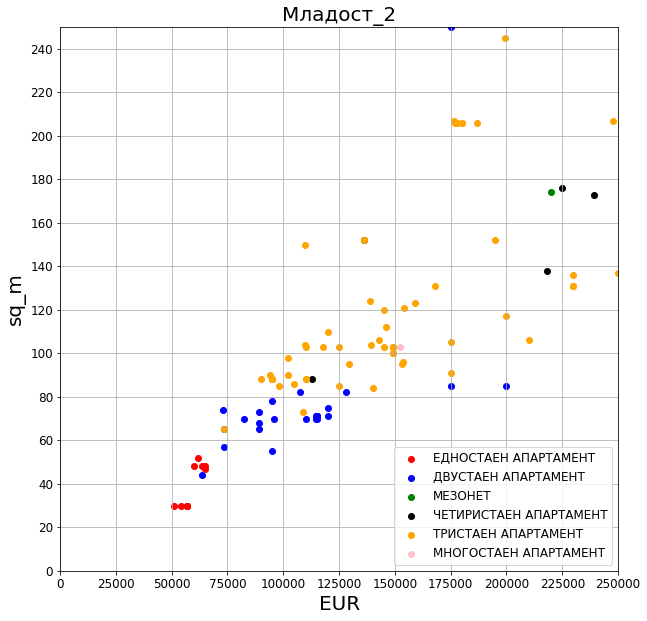

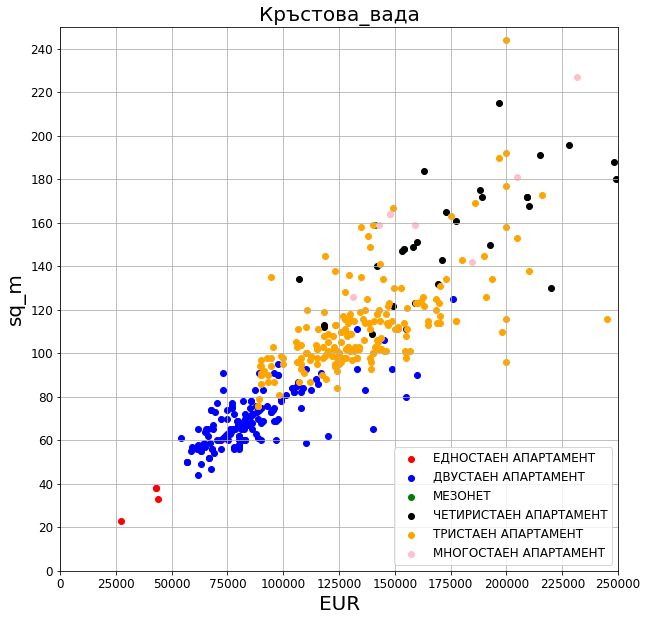

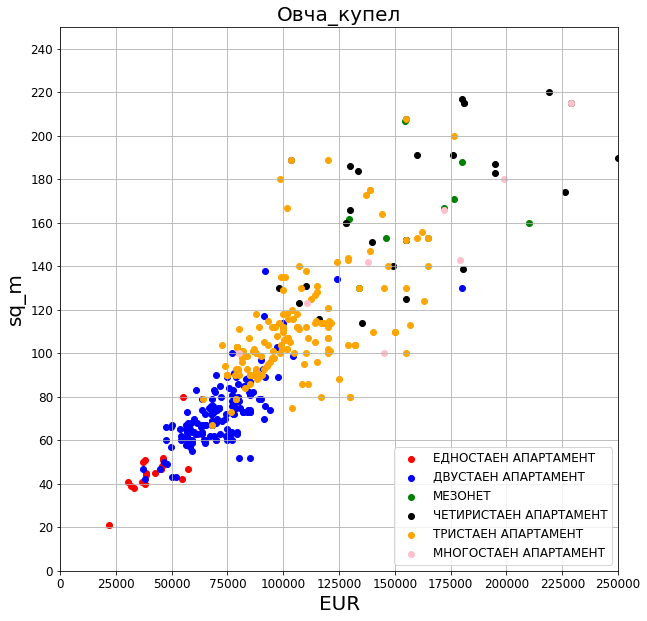

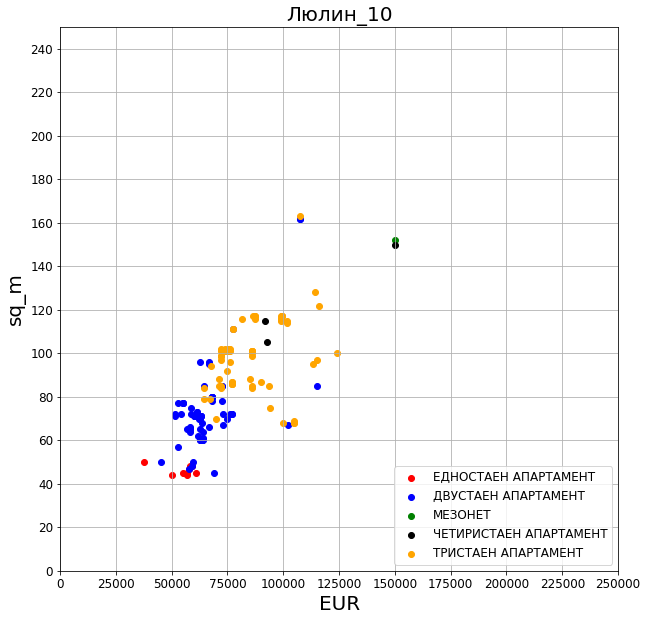

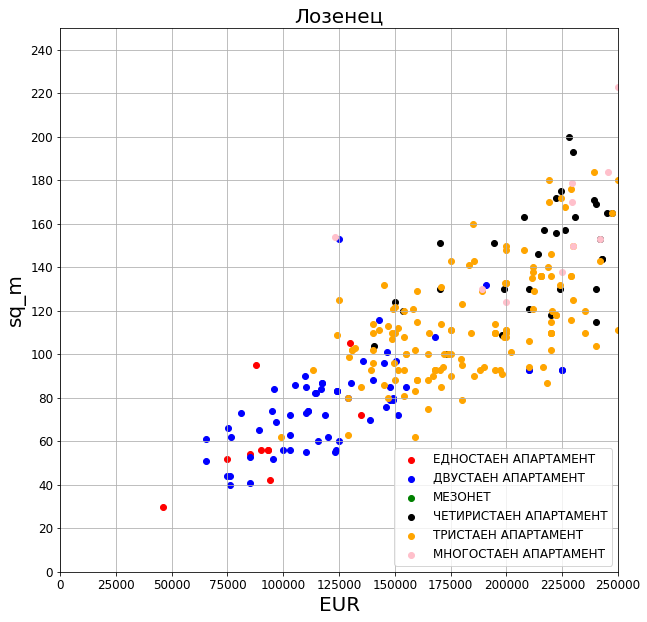

...

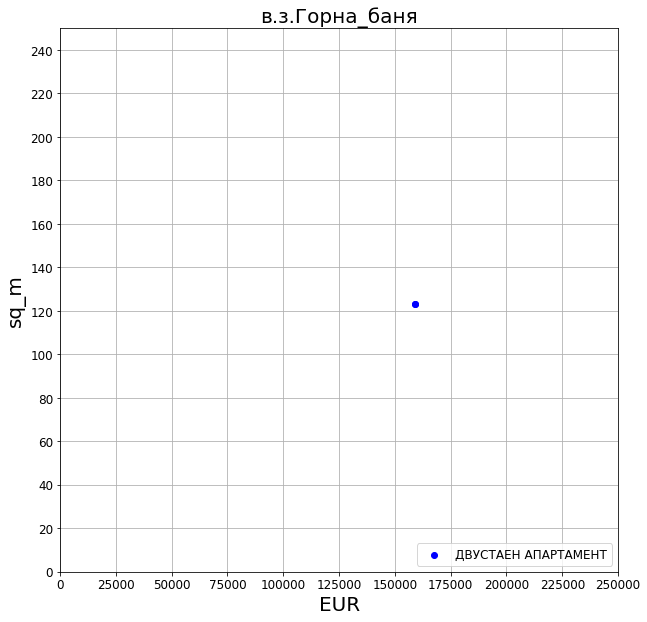

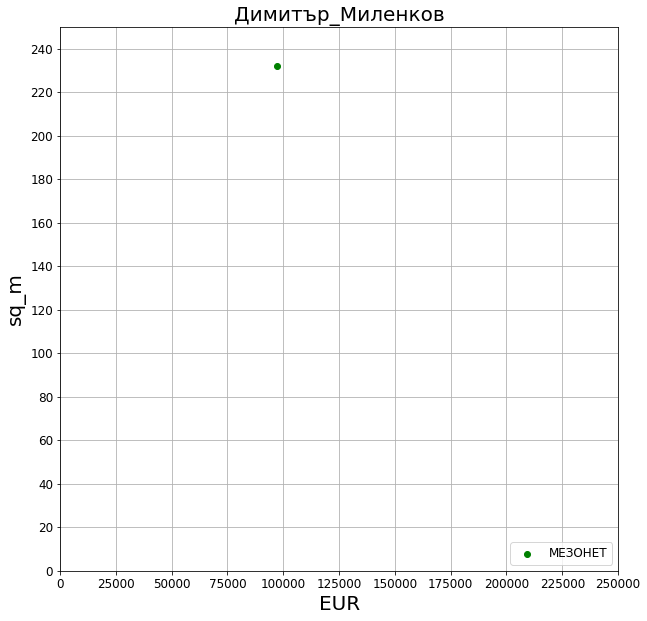

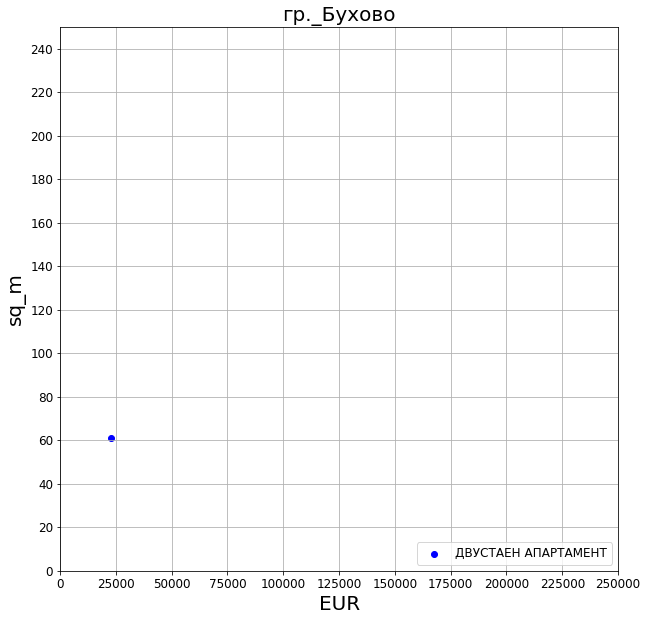

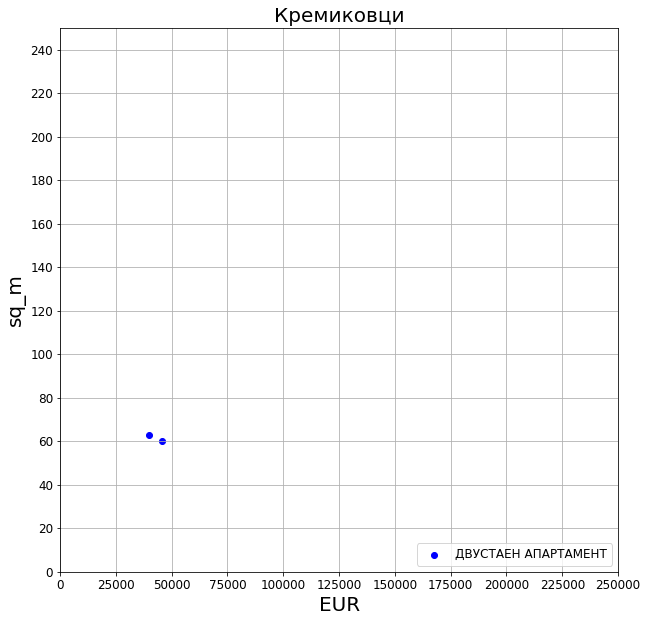

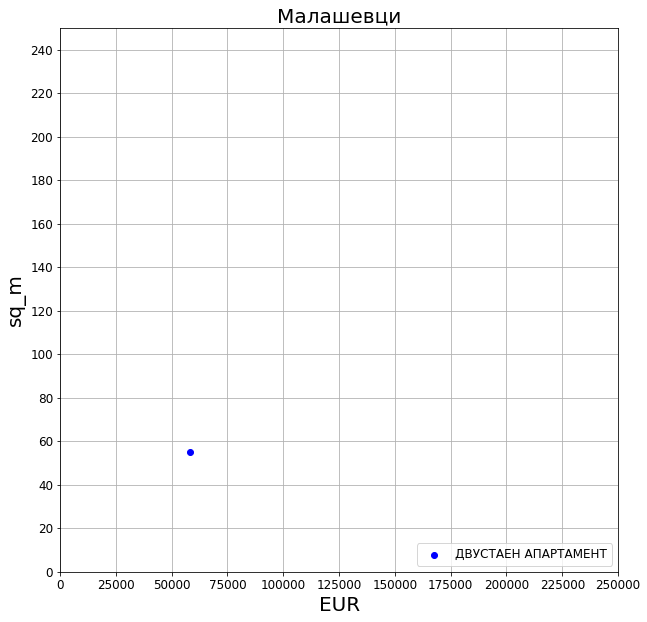

In [79]:
#f, axes = plot.subplots(holmes['neighbourhood'].nunique()//3, 3, figsize=(25, 25))

colors = {'ЕДНОСТАЕН АПАРТАМЕНТ':'red',
          'ДВУСТАЕН АПАРТАМЕНТ':'blue',
          'МЕЗОНЕТ':'green',
          'ЧЕТИРИСТАЕН АПАРТАМЕНТ':'black',
          'ТРИСТАЕН АПАРТАМЕНТ': 'orange',
          'МНОГОСТАЕН АПАРТАМЕНТ': 'yellow'}

typs = ['ЕДНОСТАЕН АПАРТАМЕНТ', 'ДВУСТАЕН АПАРТАМЕНТ', 'МЕЗОНЕТ', 'ЧЕТИРИСТАЕН АПАРТАМЕНТ', 'ТРИСТАЕН АПАРТАМЕНТ', 'МНОГОСТАЕН АПАРТАМЕНТ']
cols = ['red', 'blue', 'green', 'black', 'orange', 'pink']
x_ticks = [0, 25000, 50000, 75000, 100000, 125000, 150000, 175000, 200000, 225000, 250000]
y_ticks = [0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240]


              
for neigh in master_df['neighbourhood'].unique():
    #ind_x = ind // 3
    #ind_y = ind % 3
    plot.subplots(figsize=(10, 10))
    
    for ind, typ in enumerate(typs):
        
        holmes_subset = master_df[(master_df['neighbourhood'] == neigh) & (master_df['title'] == typ)]
        if holmes_subset.shape[0] > 0:
            plot.scatter(x=holmes_subset["price"], 
                 y=holmes_subset["area"],
                 label=typs[ind],
                 c=cols[ind])
            
    plot.legend(loc=4, prop={'size': 12})
    plot.title(neigh, fontsize=20)
    plot.xlabel('EUR', fontsize=20)
    plot.xticks(x_ticks, fontsize=12)
    plot.ylabel('sq_m', fontsize=20)
    plot.yticks(y_ticks, fontsize=12)
    plot.grid()
    plot.ylim(0, 250)
    plot.xlim(0, 250000)
    plot.savefig('output/' + neigh + '.png')
    plot.show()
    # plot.legend(handles = holmes_subset["title"].unique(), [colors[i] for i in holmes_subset["title"].unique()], loc=4)
    
    # plot.savefig(neigh +".png")

In [80]:
df = master_df.groupby(['neighbourhood', 'title']).agg({'price': ['count', 'median', 'mean', 'max', 'min'],
                                      'price_sqm': ['median', 'mean', 'max', 'min'],
                                      'area': ['median', 'min'],
                                      'views': ['median', 'mean']}).reset_index()
df.columns = ['_'.join(col).strip() for col in df.columns.values]
df.sort_values(by='price_count', ascending=False, inplace=True)

In [81]:
# df.to_csv('holmes_agg.tsv', index=False, sep='\t')

In [82]:
from shapely.geometry import Point, Polygon
import geopy.distance
import geopandas as gpd


def convert_to_geopandas(df, lon_column='lon', lat_column='lat'):
    crs = {'init': 'epsg:4326'}
    df['coor'] = df[[lon_column, lat_column]].values.tolist()
    df['coor'] = df['coor'].apply(Point)
    df = gpd.GeoDataFrame(df,
                          crs=crs,
                          geometry='coor')

    return df

In [102]:
master_gdf = convert_to_geopandas(master_df)

C:\Py\Miniconda3\envs\geo\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Py\Miniconda3\envs\geo\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [103]:
agg = master_gdf.groupby('neighbourhood').agg({'price_sqm': ['std', 'mean', 'count']}).reset_index()
agg.columns = ['_'.join(col).strip() for col in agg.columns.values]
master_df = pd.merge(master_df, agg, left_on ='neighbourhood', right_on ='neighbourhood_', how='left')
master_df['price_sqm_anomaly'] = round((master_df['price_sqm'] - master_df['price_sqm_mean']) / master_df['price_sqm_std'], 2)
master_df['bin'] = pd.qcut(master_df['price_sqm_anomaly'], q=7, precision=0, labels=list(np.arange(start=7, stop=0, step=-1)))
master_df[['title', 'neighbourhood', 'price_sqm_count', 'price_sqm_anomaly', 'bin',  'price_sqm_std', 'price_sqm', 'price_sqm_mean']].head()

,title,neighbourhood,price_sqm_count,price_sqm_anomaly,bin,price_sqm_std,price_sqm,price_sqm_mean
0,ДВУСТАЕН АПАРТАМЕНТ,Младост_2,113,1.01,1,323.350512,1690.14,1364.503451
1,ТРИСТАЕН АПАРТАМЕНТ,Кръстова_вада,430,0.70,2,213.519855,1378.67,1229.493628
2,ДВУСТАЕН АПАРТАМЕНТ,Овча_купел,392,-0.74,6,173.518195,845.58,974.749847
3,ДВУСТАЕН АПАРТАМЕНТ,Люлин_10,159,-1.35,7,197.131583,652.29,919.067799
4,ДВУСТАЕН АПАРТАМЕНТ,Лозенец,355,0.08,3,526.235223,1785.71,1742.074479


In [109]:
master_df['lon'] = master_df['lon'].astype(float)
master_df['lat'] = master_df['lat'].astype(float)

master_gdf = master_df[(~pd.isnull(master_df['lon'])) & (~pd.isnull(master_df['lat'])) & (master_df['lon'] > 0) & (master_df['lat'] > 0)]
master_gdf = master_gdf[master_gdf['price'] < 80000]

In [110]:
def set_color(price, area):
    if price < 50 * 10**3:
        return '#28C223'
    elif price < 65 * 10**3:
        return '#FF3300'
    elif price < 80 * 10**3:
        return '#000000'
    elif price < 100 * 10**3:
        return '#19D6E0'
    else:
        return '#FF9900'
    


In [111]:
m = folium.Map(tiles='cartodbpositron', location=[master_gdf['lon'].mean(), master_gdf['lat'].mean()])

for ind, row in master_gdf.iterrows():
    folium.Circle(
        location=[row['lon'], row['lat']],
        popup=str(row['price']) + ' EUR for ' + str(row['area']) + ' m2, EUR/sqm anomaly: ' + str(row['price_sqm_anomaly']) + ', link: ' + row['link'], # pop-up label for the marker
        radius=row['area']/3,
        color=set_anomaly_color(row['bin']) # set_color(row['price'], row['area']),
        ).add_to(m)

m

In [72]:
lower_price[['bin', 'price_change']].head()

,bin,price_change
207,1,-5100.0
417,5,-9107.0
538,6,-15410.0
613,4,-8900.0
649,4,-8000.0


In [65]:
master_df[master_df['agency'].map(str).apply(lambda x: 'СТАРТАЙМ' in x)]

,agency,area,date,description,floor,id,lat,link,lon,neighbourhood,price,price_sqm,title,views,has_street,is_subway,has_view,is_finished,is_under_construction,is_new
627,СТАРТАЙМ,115.0,20:56 на 27 февруари 2020 год.,ПРОСТОРЕН И КЛАСЕН имот в ЕЛИТЕН РАЙОН близо д...,3-ти,1c158210375081980,23.339600,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.694251,Докторски_паметник,330000.0,2869.56,ТРИСТАЕН АПАРТАМЕНТ,34.0,False,True,False,False,False,False
4486,СТАРТАЙМ,112.0,10:08 на 28 февруари 2020 год.,КЛЮЧ В АГЕНЦИЯТА!! Стартайм предлага за продаж...,4-ти,1c156992412810470,23.360453,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.681426,Гео_Милев,125000.0,1116.07,ТРИСТАЕН АПАРТАМЕНТ,612.0,False,False,False,False,False,False
4722,СТАРТАЙМ,112.0,10:57 на 28 февруари 2020 год.,КЛЮЧ В АГЕНЦИЯТА!! Стартайм предлага за продаж...,4-ти,1d157485547378975,23.360453,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.681426,Гео_Милев,125000.0,1116.07,ЧЕТИРИСТАЕН АПАРТАМЕНТ,457.0,False,False,False,False,False,False
2028,СТАРТАЙМ,90.0,10:57 на 28 февруари 2020 год.,С КЛЮЧ В АГЕНЦИЯТА!! Огледи по всяко време! Пр...,1-ви,1d157363116981099,23.360453,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.681426,Гео_Милев,145000.0,1611.11,ЧЕТИРИСТАЕН АПАРТАМЕНТ,339.0,False,False,False,False,False,False
2665,СТАРТАЙМ,90.0,10:57 на 28 февруари 2020 год.,С КЛЮЧ!! Огледи по всяко време! Продава се с ц...,1-ви,1c158140831185416,23.360453,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.681426,Гео_Милев,145000.0,1611.11,ТРИСТАЕН АПАРТАМЕНТ,56.0,False,False,False,False,False,False
3041,СТАРТАЙМ,88.0,10:10 на 28 февруари 2020 год.,БЕЗ КОМИСИОННА ОТ КУПУВАЧА!!! С КЛЮЧ!!! Старта...,8-ми,1c156949802331368,23.307431,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.726051,Толстой,79998.0,909.06,ТРИСТАЕН АПАРТАМЕНТ,508.0,False,True,False,False,False,False
1322,СТАРТАЙМ,95.0,11:25 на 27 февруари 2020 год.,Ново СТРОИТЕЛСТВО!! Предлагаме тристаен ЗП-94 ...,2-ри,1c158150324357635,23.305607,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.651889,Кръстова_вада,99000.0,1042.10,ТРИСТАЕН АПАРТАМЕНТ,51.0,True,False,False,False,False,False
2246,СТАРТАЙМ,105.0,10:09 на 28 февруари 2020 год.,Стартайм предлага 3-стаен обзаведен апартамент...,3-ти,1c158218635173895,23.248948,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.666543,Карпузица,124000.0,1180.95,ТРИСТАЕН АПАРТАМЕНТ,25.0,False,False,False,False,False,False
5064,СТАРТАЙМ,115.0,11:14 на 28 февруари 2020 год.,ПРОСТОРЕН И КЛАСЕН имот в ЕЛИТЕН РАЙОН близо д...,3-ти,1c157909386216588,23.342208,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.695511,Оборище,330000.0,2869.56,ТРИСТАЕН АПАРТАМЕНТ,102.0,False,True,False,False,False,False
7634,СТАРТАЙМ,100.0,10:19 на 25 февруари 2020 год.,Стартайм ЕООД имоти предлага просторен тристае...,4-ти,1c155186258608421,23.233606,http://sofia.holmes.bg/pcgi/home.cgi?act=3&adv...,42.655969,Княжево,103000.0,1030.00,ТРИСТАЕН АПАРТАМЕНТ,489.0,False,False,False,False,False,False


In [46]:
m.save(outfile='imoti_map.html')